%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import pickle
import dill
import numpy as np
import scipy as sp
import pandas as pd
import warnings
from tqdm import tqdm
import astropy
from astropy import stats

from matplotlib import pyplot as plt
import statsmodels.formula.api as smf
import seaborn as sns
sns.set_style("white")

from reward_relative import utilities as ut
from reward_relative import plotUtils as pt
from reward_relative import spatial
from reward_relative import placeCellPlot
from reward_relative import dayData as dd
from reward_relative import regression
    

save_figures = False

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from reward_relative.path_dict_seahorse import path_dictionary as path_dict
from reward_relative import utilities as ut
from reward_relative import plotUtils as pt
from reward_relative import spatial
from reward_relative import placeCellPlot
from reward_relative import dayData as dd
from reward_relative import behavior
import pickle
import dill
import numpy as np
import os 
import matplotlib.pyplot as plt
import TwoPUtils


In [3]:
path_dict

{'preprocessed_root': '/data/2p_data',
 'sbx_root': '/media/sosalab/T71/2p_raw_data',
 'gdrive_root': '/mnt/gdrive/2P_Data',
 'VR_Data': '/data/2p_data/VR_Data',
 'git_repo_root': '/home/sosalab/local_repos',
 'TwoPUtils': '/home/sosalab/local_repos/TwoPUtils',
 'home': '/home/sosalab',
 'fig_dir': '/data/2p_data/fig_scratch'}

## Load pre-saved multiDayData

To make multiDayData, run `make_multiDayData_class.ipynb`

In [4]:
experiment = 'MetaLearn'
year = 'combined'
exp_days = [3, 5, 7, 8, 10, 12, 14]

max_anim_list = dd.max_anim_list(experiment, exp_days, year=year)

## These parameters were used for computing the saved multiDayData
# bin_size = 10  # for quantifying distribution of place field peak locations
# sigma = 1  # for smoothing
# smooth = False  # whether to smooth for finding place cell peaks
# exclude_int = True  # exclude putative interneurons
# int_thresh = 0.5

## Place cell logical definitions:
## 'and' = must have significant spatial information
## in trial set 0 AND trial set 1 (i.e. before and after the reward switch)
## 'or' = must have signitive spatial information in trial set 0 OR trial set 1

# place_cell_logical = 'or'
ts_key = 'dff'  # which timeseries to use for finding peaks
# use_speed_thr = True  # use a speed threshold to calculate new trial matrices
# # speed threshold in cm/s (excludes data at speed less than this)
# speed_thr = 2

reward_dist_inclusive = 50  # in cm

# datetime of saved file
dt = "202504"

pkl_name = "%s_expdays%s_multiDayData_%s_%s.pickle" % (
    # ut.make_anim_tag(max_anim_list),
    f'm{ut.get_mouse_number(max_anim_list[0])}-{ut.get_mouse_number(max_anim_list[-1])}',
    ut.make_day_tag(
        exp_days),
    ts_key,
    dt)
pkl_path = os.path.join(
    path_dict['preprocessed_root'], 'multi_anim_sess', pkl_name)
print(pkl_path)
multiDayData = dill.load(open(pkl_path, "rb"), ignore=True)

include_ans = multiDayData[exp_days[-1]
                           ].circ_rel_stats_across_an['include_ans']
max_anim_list = sorted(np.unique(np.concatenate([multiDayData[day].anim_list
                                                 for day in exp_days])),
                       key=len)
include_ans

/data/2p_data/multi_anim_sess/m2-19_expdays3-5-7-8-10-12-14_multiDayData_dff_202504.pickle


array(['GCAMP3', 'GCAMP4', 'GCAMP7', 'GCAMP11', 'GCAMP12', 'GCAMP13',
       'GCAMP14', 'GCAMP15', 'GCAMP17', 'GCAMP18', 'GCAMP19'], dtype='<U7')

In [5]:
## Get cell indices by remapping type
example_day = 14
example_an = 'GCAMP14' # corresponds to mouse "m14"
## to exclude RR cells from other categories, set 'exclude_rr_from_others' to True
_, cell_inds = dd.get_cell_class_n(multiDayData, example_day, example_an, exclude_rr_from_others=True, verbose=True)


excluding 0 from 153 track
excluding 6 from 70 disappear
excluding 13 from 109 appear
excluding 40 from 51 reward
excluding 14 from 120 nonreward_remap


In [7]:
# load multi_anim_sess that has the spatial activity to plot
multi_anim_sess = dd.load_multi_anim_sess(path_dict, example_day, multiDayData[example_day].anim_list,
                                          subdirs = ['multi_anim_sess'])

### Plot example place cells by remapping type

In [8]:
sess = multi_anim_sess[example_an]['sess']

In [9]:
import TwoPUtils
# Get the trial-by-trial activity, at speeds > speed_thr
tm = TwoPUtils.spatial_analyses.trial_matrix(sess.timeseries['events'].T,
                                                sess.vr_data['pos']._values,
                                                sess.trial_start_inds,
                                                sess.teleport_inds,
                                                bin_size=1,
                                                min_pos=0,
                                                max_pos=450,
                                                speed_thr=2,
                                                speed=sess.vr_data['speed']._values,
                                                impute_nans = True,
                                                
                                                )

/home/sosalab/local_repos/TwoPUtils/TwoPUtils/spatial_analyses.py:73: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


In [10]:
trials = tm[0]
pre = slice(11,30, 1)
mid = slice(31, 50, 1)
post = slice(60,-1, 1)

    


In [11]:
trials[pre].mean(axis = 0).shape

(450, 876)

In [12]:
sess.print_session_info()

VR_only : False
_abc_impl : <_abc._abc_data object at 0x748935999240>
basedir : /data/InVivoDA/GCAMP14
basedir_2P : None
basedir_VR : None
date : 06_03_2023
iscell : [[0.00000000e+00 9.66748550e-01]
 [1.00000000e+00 9.71944381e-01]
 [1.00000000e+00 9.87758325e-01]
 ...
 [0.00000000e+00 7.60085077e-03]
 [0.00000000e+00 3.30851120e-01]
 [0.00000000e+00 7.17546063e-04]]
mouse : GCAMP14
n_planes : 1
plane_per_cell : [0. 0. 0. ... 0. 0. 0.]
prompt_for_keys : False
s2p_ops : {'suite2p_version': '0.10.3', 'look_one_level_down': False, 'fast_disk': '/data/InVivoDA/GCAMP14/06_03_2023/Env2_LocationA_to_C/Env2_LocationA_to_C_001_005/suite2p/plane0', 'delete_bin': False, 'mesoscan': False, 'bruker': False, 'bruker_bidirectional': False, 'h5py': [], 'h5py_key': 'data', 'nwb_file': '', 'nwb_driver': '', 'nwb_series': '', 'save_path0': '/data/InVivoDA/GCAMP14/06_03_2023/Env2_LocationA_to_C/Env2_LocationA_to_C_001_005', 'save_folder': 'suite2p', 'subfolders': [], 'move_bin': True, 'nplanes': 1, 'nchan

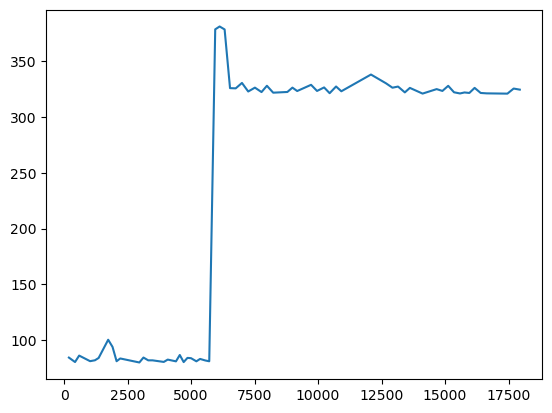

In [13]:
plt.figure()
plt.plot(sess.vr_data.loc[sess.vr_data.reward>0].pos)

In [14]:
r_zones, r_zone_names = behavior.get_reward_zones(sess)

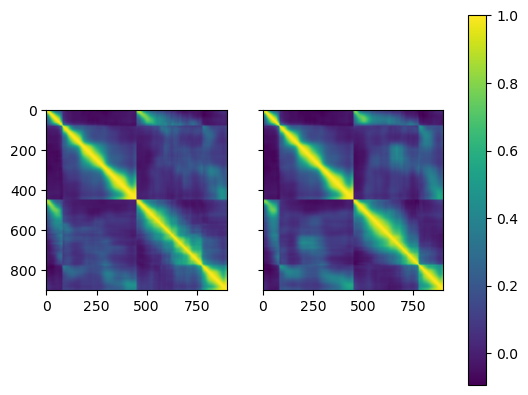

In [15]:
# the shape of these mean population vectors indicate that row-wise
# pearsons (the default for corrcoef) are happening along the axis of 
# the track. IE the population vector is length ncells, where each 
# element is the mean firing rate for a given cell across the trial slices.
# so the upper left quad is pre vs pre, 
# the lower right quad is mid vs mid
# and the upper right quad is pre vs mid. 

fig, axs = plt.subplots(ncols = 2, sharex = True, sharey=True)
axs[0].imshow(np.corrcoef(trials[pre].mean(axis = 0), trials[mid].mean(axis = 0)))
im = axs[1].imshow(np.corrcoef(trials[pre].mean(axis = 0), trials[post].mean(axis = 0)))
fig.colorbar(im, ax=axs)


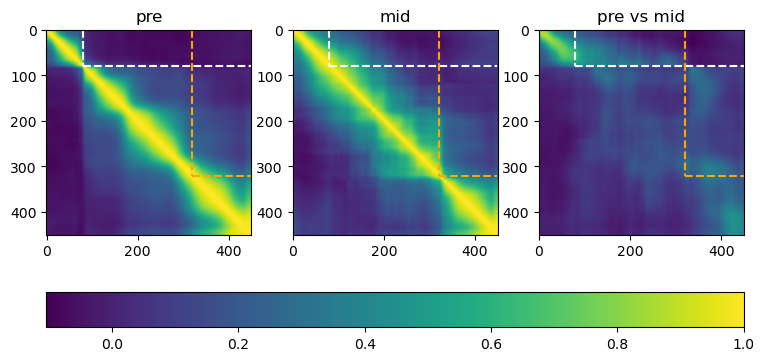

In [16]:

corr_mat_pre_mid = np.corrcoef(trials[pre].mean(axis = 0), trials[mid].mean(axis = 0))

corr_pre_pre = corr_mat_pre_mid[:450,:450]
corr_pre_mid = corr_mat_pre_mid[0:450, 450:]
corr_mid_mid = corr_mat_pre_mid[450:, 450:]

fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, [corr_pre_pre, corr_mid_mid, corr_pre_mid], ['pre', 'mid', 'pre vs mid']):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [r_zones[0][0]], ymin=0, ymax=r_zones[0][0], color = 'white', linestyles= '--')
    ax.hlines(y = [r_zones[0][0]], xmin = r_zones[0][0], xmax = 449, color = 'white', linestyles= '--')

    ax.vlines(x = [r_zones[-1][0]], ymin = 0, ymax = r_zones[-1][0], color = 'orange', linestyles= '--')
    ax.hlines(y = [r_zones[-1][0]], xmin = r_zones[-1][0], xmax = 449, color = 'orange', linestyles= '--')
    ax.set_title(title)


fig.colorbar(im, ax=axs, location = 'bottom')


In [17]:
def correlate_two_pop_vectors(pv1, pv2, pv1_name, pv2_name):
    '''take two pop vectors and their names, and return:
    corr_matrices --> list
    corr_names    --> list'''
    corr_mat = np.corrcoef(pv1, pv2)

    return [corr_mat[:450,:450],  corr_mat[450:, 450:], corr_mat[0:450, 450:],], [f'{pv1_name}', f'{pv2_name}', f'{pv1_name}_v_{pv2_name}']


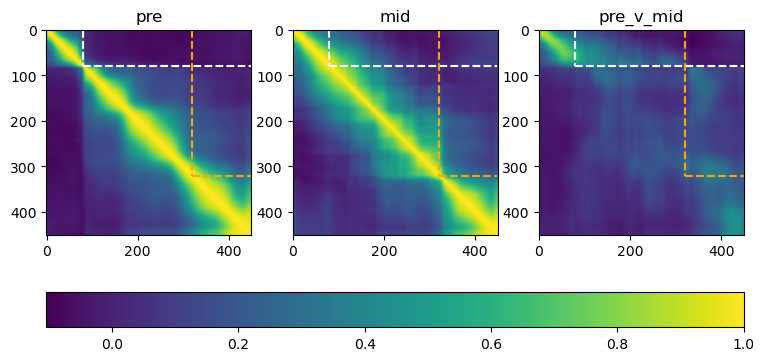

In [18]:
corr_mats, names = correlate_two_pop_vectors(trials[pre].mean(axis = 0), trials[mid].mean(axis = 0), 'pre', 'mid')



fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    # im = ax.imshow(np.triu(corr_mat), clim = clim)
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [r_zones[0][0]], ymin=0, ymax=r_zones[0][0], color = 'white', linestyles= '--')
    ax.hlines(y = [r_zones[0][0]], xmin = r_zones[0][0], xmax = 449, color = 'white', linestyles= '--')

    ax.vlines(x = [r_zones[-1][0]], ymin = 0, ymax = r_zones[-1][0], color = 'orange', linestyles= '--')
    ax.hlines(y = [r_zones[-1][0]], xmin = r_zones[-1][0], xmax = 449, color = 'orange', linestyles= '--')
    ax.set_title(title)


fig.colorbar(im, ax=axs, location = 'bottom')

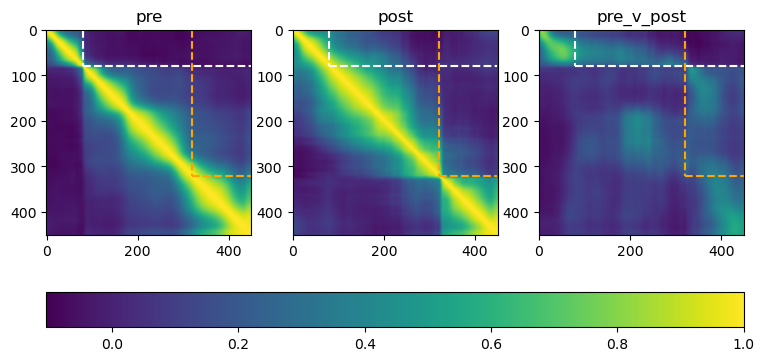

In [19]:


corr_mats, names = correlate_two_pop_vectors(trials[pre].mean(axis = 0), trials[post].mean(axis = 0), 'pre', 'post')



fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [r_zones[0][0]], ymin=0, ymax=r_zones[0][0], color = 'white', linestyles= '--')
    ax.hlines(y = [r_zones[0][0]], xmin = r_zones[0][0], xmax = 449, color = 'white', linestyles= '--')

    ax.vlines(x = [r_zones[-1][0]], ymin = 0, ymax = r_zones[-1][0], color = 'orange', linestyles= '--')
    ax.hlines(y = [r_zones[-1][0]], xmin = r_zones[-1][0], xmax = 449, color = 'orange', linestyles= '--')
    ax.set_title(title)


fig.colorbar(im, ax=axs, location = 'bottom')

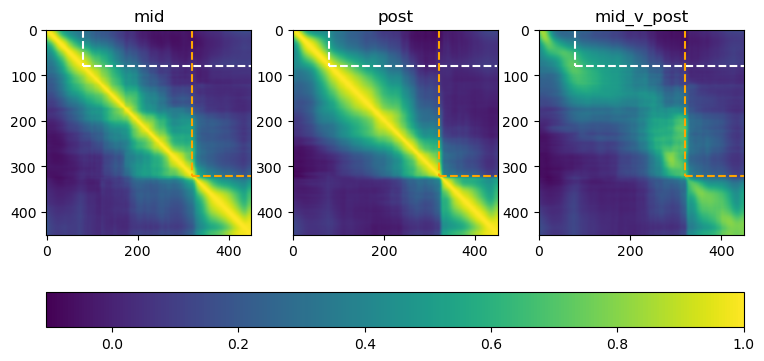

In [20]:
corr_mats, names = correlate_two_pop_vectors(trials[mid].mean(axis = 0), trials[post].mean(axis = 0), 'mid', 'post')



fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [r_zones[0][0]], ymin=0, ymax=r_zones[0][0], color = 'white', linestyles= '--')
    ax.hlines(y = [r_zones[0][0]], xmin = r_zones[0][0], xmax = 449, color = 'white', linestyles= '--')

    ax.vlines(x = [r_zones[-1][0]], ymin = 0, ymax = r_zones[-1][0], color = 'orange', linestyles= '--')
    ax.hlines(y = [r_zones[-1][0]], xmin = r_zones[-1][0], xmax = 449, color = 'orange', linestyles= '--')
    ax.set_title(title)


fig.colorbar(im, ax=axs, location = 'bottom')

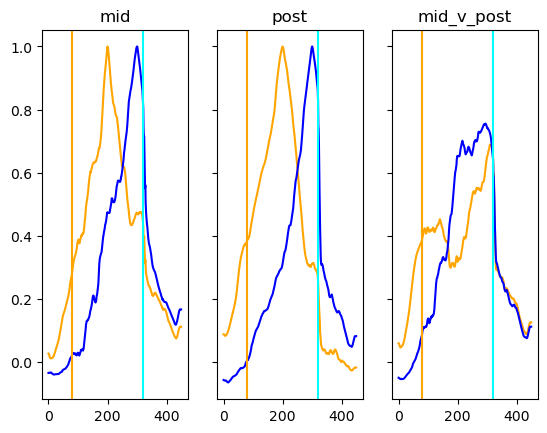

In [21]:
fig, axs = plt.subplots(ncols = 3, sharey = True)
idx1 = 200
idx2 = 300
for ax, mat, title in zip(axs, corr_mats, names):

    comps_1 = np.concatenate((mat[0:idx1, idx1], mat[idx1, idx1:]))
    comps_2 = np.concatenate((mat[0:idx2, idx2], mat[idx2, idx2:]))
    
    ax.plot(comps_1, label = 'reward zone pre', color = 'orange')
    ax.plot(comps_2, label = 'reward zone post', color = 'blue')
    ax.set_title(title)

for ax in axs:
    ax.axvline(r_zones[0][0], color = 'orange')
    ax.axvline(r_zones[-1][0], color =  'cyan')

In [22]:
def circ_shift(sess, lin_bin_size = 1 , ts_key = 'events'):
    from reward_relative import circ

    reward_zone, _ = behavior.get_reward_zones(sess)
    trial_dict = behavior.define_trial_subsets(sess, force_two_sets=True)

    trial_set0 = trial_dict['trial_set0']
    trial_set1 = trial_dict['trial_set1']
    tstart_inds = sess.trial_start_inds
    tstop_inds = sess.teleport_inds

    max_pos = sess.trial_matrices[ts_key][-2][-1]  # 450
    min_pos = 0
    circ_bin_size = 2*np.pi/((max_pos-min_pos)/lin_bin_size)


    circ_pos = spatial.pos_cm_to_rad(
        sess.vr_data['pos'].values, max_pos, min_pos=min_pos)
    rzone0 = np.unique(reward_zone[trial_set0, :])
    rzone1 = np.unique(reward_zone[trial_set1, :])

    rzone_diff = rzone0[0] - rzone1[0]

    circ_rzone0 = spatial.pos_cm_to_rad(rzone0, max_pos, min_pos=min_pos)
    circ_rzone1 = spatial.pos_cm_to_rad(rzone1, max_pos, min_pos=min_pos)

    circ_tm = TwoPUtils.spatial_analyses.trial_matrix(sess.timeseries[ts_key].T,
                                                        circ_pos,
                                                        tstart_inds,
                                                        tstop_inds,
                                                        bin_size=circ_bin_size,
                                                        min_pos=-np.pi,
                                                        max_pos=np.pi,
                                                        speed_thr=2,
                                                        speed=sess.vr_data['speed'].values
                                                        )
    # find the number of indices that aligns rzone1 with rzone 1
    if rzone0[0] > rzone1[0]:
        shift = int(
            np.round((circ_rzone0[0]-circ_rzone1[0])/circ_bin_size))
        trackstart_shift = circ.phase_diff(spatial.pos_cm_to_rad(np.abs(rzone_diff), max_pos, min_pos=min_pos),
                                            spatial.pos_cm_to_rad(0, max_pos, min_pos=min_pos))

    elif rzone1[0] > rzone0[0]:
        shift = - \
            int(np.round((circ_rzone1[0]-circ_rzone0[0])/circ_bin_size))
        trackstart_shift = -circ.phase_diff(spatial.pos_cm_to_rad(np.abs(rzone_diff), max_pos, min_pos=min_pos),
                                            spatial.pos_cm_to_rad(0, max_pos, min_pos=min_pos))

    print(shift)

    circ_tm[0][trial_set1, :, :] = np.roll(
        circ_tm[0][trial_set1, :, :],
        shift,
        axis=1
    )

    circ_rzone1 = circ.wrap(
        circ_rzone1 + circ.wrap(circ_rzone0[0]-circ_rzone1[0])
    )

    reward_zone = np.vstack((
        np.tile(np.expand_dims(circ_rzone0, 1).T,
                (len(np.where(trial_set0)[0]), 1)),
        np.tile(np.expand_dims(circ_rzone1, 1).T,
                (len(np.where(trial_set1)[0]), 1))
    ))

    return circ_tm, reward_zone

circ_tm, circ_reward_z = circ_shift(sess)

/home/sosalab/local_repos/TwoPUtils/TwoPUtils/spatial_analyses.py:73: RuntimeWarning: Mean of empty slice
  trial_mat[trial, b] = np.nanmean(arr_t[(pos_t > edge1) & (pos_t <= edge2), :], axis=0)


-240


In [23]:
out = spatial.circ_shift_trial_matrix(sess, circ_bin_size=2*np.pi/((450)/1))

Getting max pos from an existing trial matrix...
max pos = 450
min pos = 0


In [24]:
circ_trials = out['circ_tm'][0]

/tmp/ipykernel_3878932/2553977247.py:1: RuntimeWarning: Mean of empty slice
  corr_mats, names = correlate_two_pop_vectors(np.nanmean(circ_trials[pre], axis = 0), np.nanmean(circ_trials[post], axis = 0), 'pre', 'post')


Text(0.5, 0.98, 'circular transform of post to match pre')

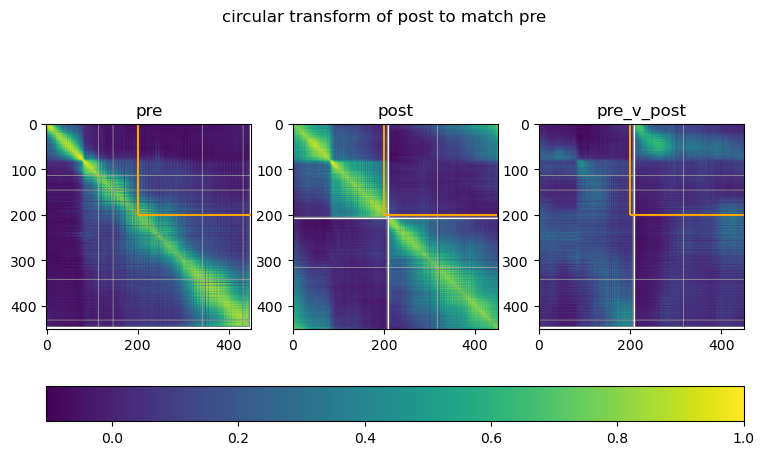

In [25]:

corr_mats, names = correlate_two_pop_vectors(np.nanmean(circ_trials[pre], axis = 0), np.nanmean(circ_trials[post], axis = 0), 'pre', 'post')



fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [200], ymin=0, ymax=200, color = 'orange')
    ax.hlines(y = [200], xmin = 200, xmax = 449, color = 'orange')

    
    ax.set_title(title)


fig.colorbar(im, ax=axs, location = 'bottom')
fig.suptitle('circular transform of post to match pre')

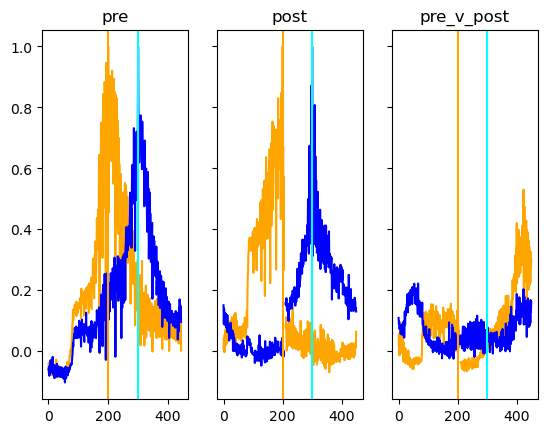

In [26]:
fig, axs = plt.subplots(ncols = 3, sharey = True)
idx1 = 200
idx2 = 300
for ax, mat, title in zip(axs, corr_mats, names):

    comps_1 = np.concatenate((mat[0:idx1, idx1], mat[idx1, idx1:]))
    comps_2 = np.concatenate((mat[0:idx2, idx2], mat[idx2, idx2:]))
    
    ax.plot(comps_1, label = 'reward zone pre', color = 'orange')
    ax.plot(comps_2, label = 'reward zone post', color = 'blue')
    ax.set_title(title)

for ax in axs:
    ax.axvline(200, color = 'orange')
    ax.axvline(300, color =  'cyan')

In [27]:
import scipy.ndimage as ndi
from scipy.ndimage import gaussian_filter, gaussian_filter1d
mat1 = gaussian_filter1d(trials[pre], sigma = 1, axis = 1)
mat2 = gaussian_filter1d(trials[post], sigma = 1, axis = 1)


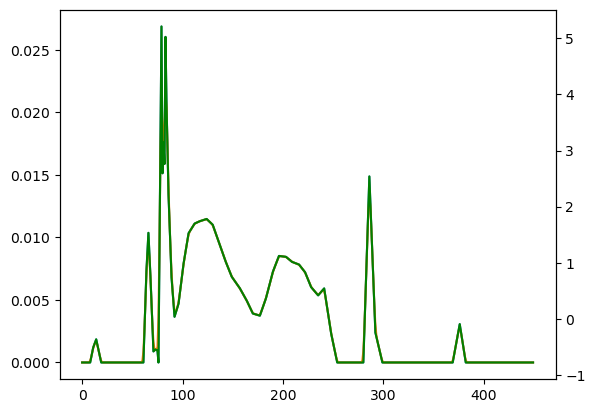

In [28]:
fig, ax = plt.subplots()
cell_id = 400
trial = 10
ax.plot(trials[pre][trial,:,cell_id])
ax.plot(mat1[trial,:,cell_id])
new_ax = ax.twinx()
new_ax.plot(ut.zscore(trials[pre][trial,:,cell_id]), color = 'green')

Text(0.5, 0.98, 'gaussian smoothed')

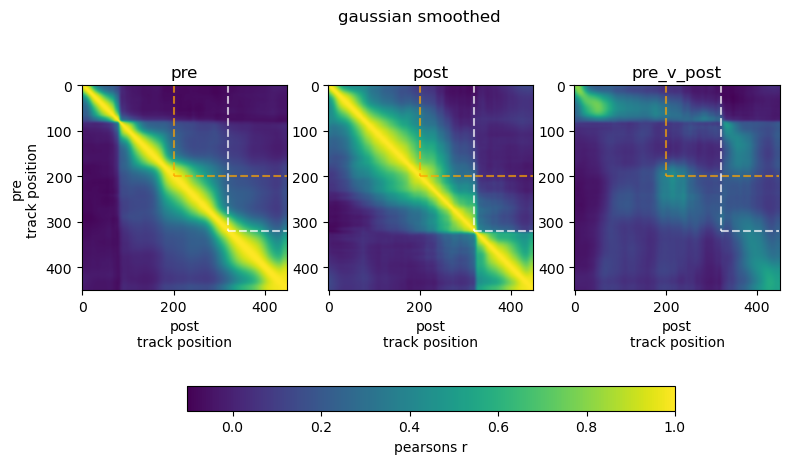

In [29]:
##### try smoothing

mat1 = gaussian_filter1d(trials[pre], sigma = 1, axis = 1)
mat2 = gaussian_filter1d(trials[post], sigma = 1, axis = 1)


corr_mats, names = correlate_two_pop_vectors(mat1.mean(axis = 0), mat2.mean(axis = 0), 'pre', 'post')



fig, axs = plt.subplots(ncols = 3, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [200], ymin=0, ymax=200, color = 'orange', linestyle = '--', alpha = 0.7)
    ax.hlines(y = [200], xmin = 200, xmax = 449, color = 'orange', linestyle = '--', alpha = 0.7)

    ax.vlines(x = [320], ymin = 0, ymax = 320, color = 'white', linestyle = '--', alpha = 0.7)
    ax.hlines(y = [320], xmin = 320, xmax = 449, color = 'white', linestyle = '--', alpha = 0.7)
    ax.set_title(title)

axs[0].set_ylabel(f'{names[0]}\ntrack position ')
for ax in axs:
    ax.set_xlabel(f'{names[1]}\ntrack position')
fig.colorbar(im, ax=axs, location = 'bottom', shrink = 0.7, pad = 0.25, label = 'pearsons r')
fig.suptitle('gaussian smoothed')

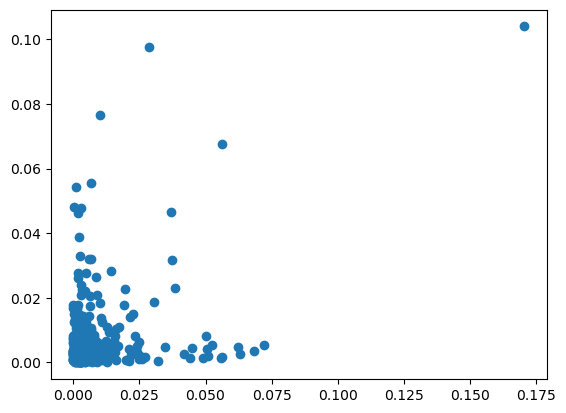

In [30]:
fig, ax = plt.subplots()
ax.scatter(trials[pre].mean(axis = 0)[200, :], trials[post].mean(axis = 0)[200,:])


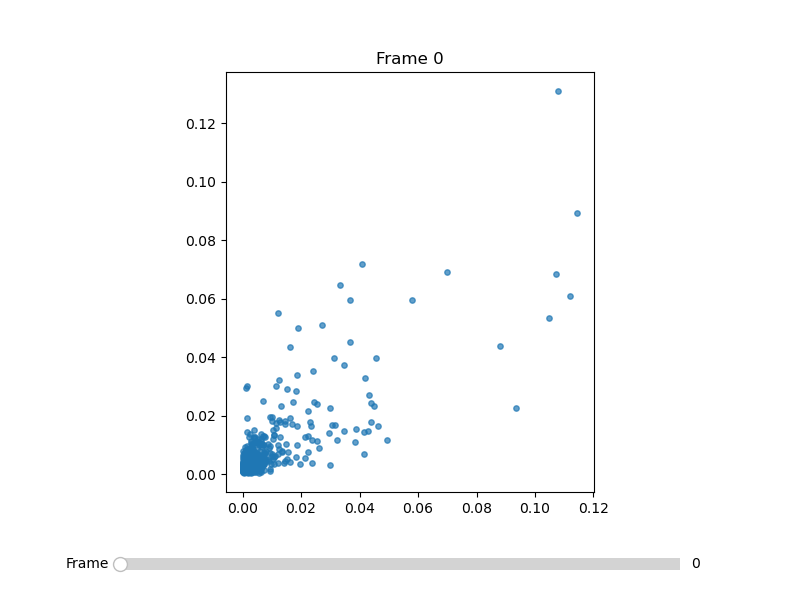

In [31]:
%matplotlib widget
from matplotlib.widgets import Slider
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path

n_frames = 450

# x_data[i] and y_data[i] are the (x, y) coords for frame i
x_data = trials[slice(10,20,1)].mean(axis = 0)
y_data = trials[slice(50,80,1)].mean(axis = 0)

# --- Figure setup ---
fig, ax = plt.subplots(figsize=(8, 6))
fig.subplots_adjust(bottom=0.18)

scatter = ax.scatter(x_data[0], y_data[0], s=15, alpha=0.7)

title = ax.set_title("Frame 0")

# --- Slider ---
ax_slider = fig.add_axes([0.15, 0.04, 0.7, 0.04])
# ax_slider = fig.add_axes([0.15, 0.04, 0.7, 0.04])
slider = Slider(
    ax_slider,
    "Frame",
    valmin=0,
    valmax=n_frames - 1,
    valinit=0,
    valstep=1,
)


def update(val):
    idx = int(slider.val)
    scatter.set_offsets(np.column_stack([x_data[idx], y_data[idx]]))
    
    title.set_text(f"track position {idx} cm, pearsons {np.round(np.corrcoef(x_data[idx], y_data[idx])[0,1], 3)}")
    fig.canvas.draw_idle()

def on_select(verts):
    idx = int(slider.val)
    path = Path(verts)
    xy = np.column_stack([x_data[idx], y_data[idx]])
    inside = path.contains_points(xy)
    # update colors: selected points highlighted
    colors = np.where(inside, "red", "steelblue")
    scatter.set_facecolors(colors)
    fig.canvas.draw_idle()

    # selected indices available here
    selected_idx = np.where(inside)[0]
    fig.suptitle(f"Selected {selected_idx} points")

lasso = LassoSelector(ax, on_select)


slider.on_changed(update)
ax.set_aspect(1)
plt.show()

Text(0, 0.5, 'mean firing rate')

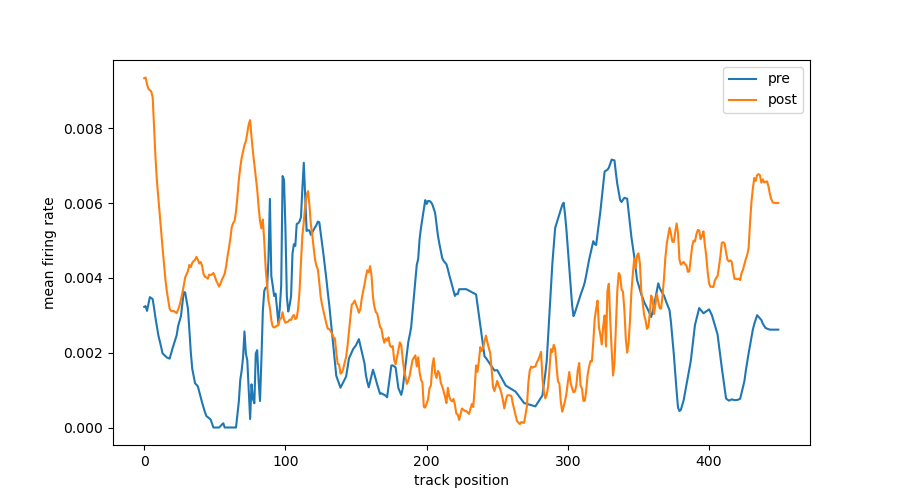

In [32]:
fig, ax = plt.subplots(figsize = (9, 5))
cell_idx = 142
ax.plot(trials[slice(10,20,1)].mean(axis = 0)[:,cell_idx], label = 'pre')
ax.plot(trials[slice(50,80,1)].mean(axis = 0)[:,cell_idx], label = 'post')
ax.legend()
ax.set_xlabel('track position')
ax.set_ylabel('mean firing rate')

Text(0.5, 0.98, 'trial 10-19 vs 20 - 29 ')

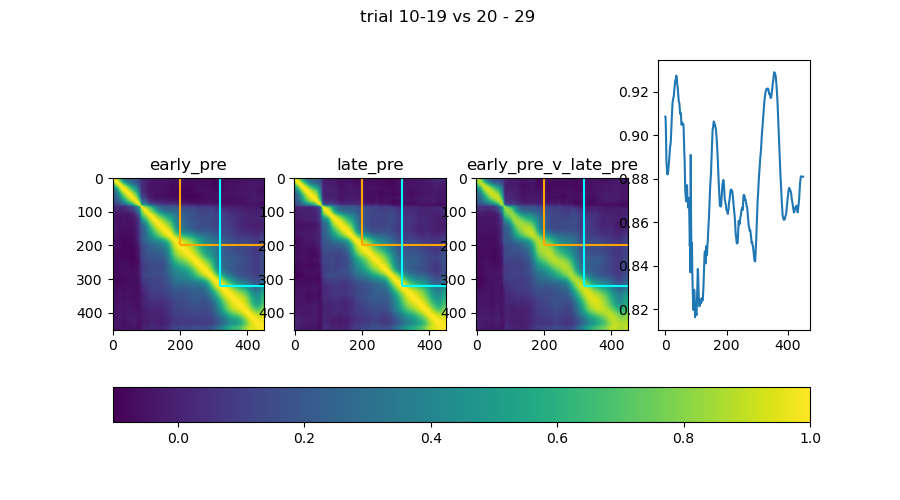

In [33]:


corr_mats, names = correlate_two_pop_vectors( trials[slice(10,20,1)].mean(axis = 0),  trials[slice(20,30,1)].mean(axis = 0), 'early_pre', 'late_pre')



fig, axs = plt.subplots(ncols = 4, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats, names):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [200], ymin=0, ymax=200, color = 'orange')
    ax.hlines(y = [200], xmin = 200, xmax = 449, color = 'orange')

    ax.vlines(x = [320], ymin = 0, ymax = 320, color = 'cyan')
    ax.hlines(y = [320], xmin = 320, xmax = 449, color = 'cyan')
    ax.set_title(title)

axs[-1].plot(np.diag(corr_mats[-1]))

fig.colorbar(im, ax=axs, location = 'bottom')
fig.suptitle('trial 10-19 vs 20 - 29 ')

Text(0.5, 0.98, 'early vs late pre-swap')

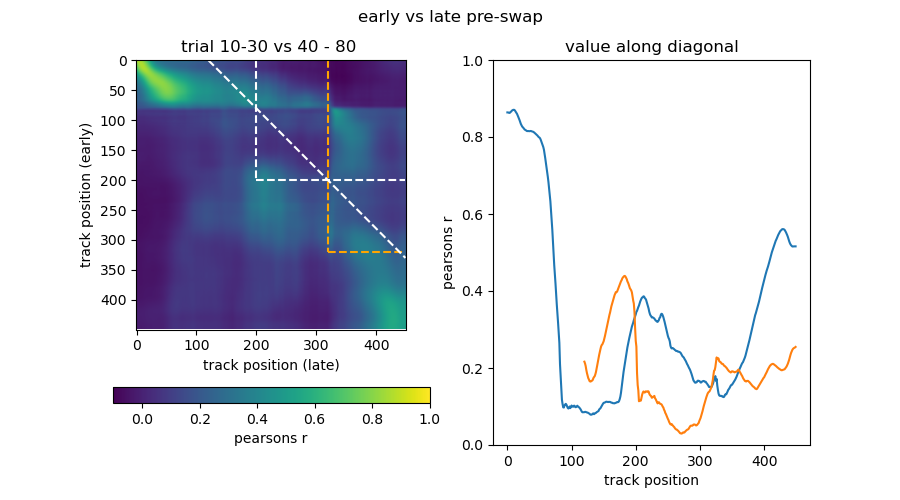

In [34]:
corr_mats, names = correlate_two_pop_vectors( trials[slice(10,30,1)].mean(axis = 0),  trials[slice(40,80,1)].mean(axis = 0), 'pre-swap', 'late_post')



fig, axs = plt.subplots(ncols = 2, figsize = (9, 5))

clim = (corr_mat_pre_mid.min(), corr_mat_pre_mid.max())

for ax, corr_mat, title in zip(axs, corr_mats[-1:], ['trial 10-30 vs 40 - 80 ']):
    im = ax.imshow(corr_mat, clim = clim)
    ax.vlines(x = [200], ymin=0, ymax=200, color = 'white', linestyle = '--')
    ax.hlines(y = [200], xmin = 200, xmax = 449, color = 'white', linestyle = '--')

    ax.vlines(x = [320], ymin = 0, ymax = 320, color = 'orange', linestyle = '--')
    ax.hlines(y = [320], xmin = 320, xmax = 449, color = 'orange', linestyle = '--')
    ax.set_title(title)
axs[0].set_xlabel('track position (late)')
axs[0].set_ylabel('track position (early)')
axs[-1].plot(np.diag(corr_mats[-1]))
# axs[-1].plot([i for i in range(120, 450,1)], np.diagonal(corr_mats[-1], offset = 120))
axs[0].plot([120, 449], [0, 450-120], color = 'white', linestyle = '--')
axs[-1].plot([i for i in range(120, 450,1)], np.diagonal(corr_mats[-1], offset = 120))
# axs[0].plot([0, 449], [0, 449], color = 'white', linestyle = '--')
axs[-1].set_xlabel('track position')
axs[-1].set_ylabel('pearsons r')
axs[-1].set_title('value along diagonal')
axs[-1].set_ylim((0,1))

fig.colorbar(im, ax=axs[0], location = 'bottom', label = 'pearsons r')
fig.suptitle('early vs late pre-swap')

In [35]:
import scipy.stats as sts
z_trials = sts.zscore(trials, axis = -1)

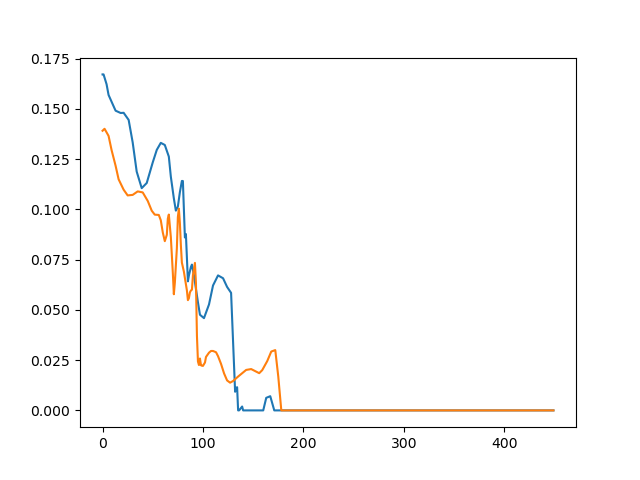

In [36]:
fig, ax = plt.subplots()
ax.plot(trials[20,:,5])
ax.plot(trials[12,:,5])

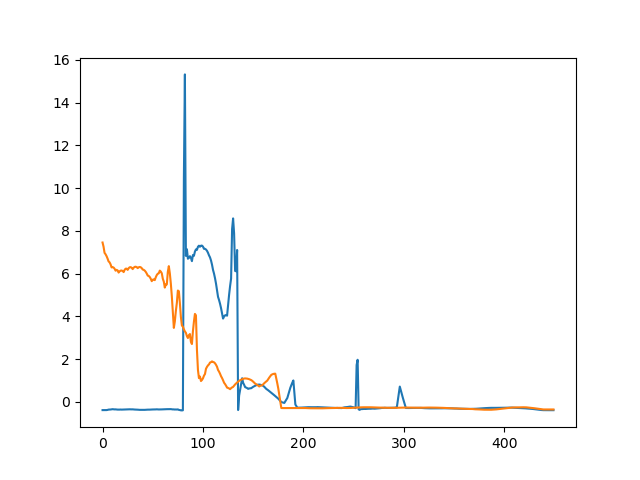

In [37]:
fig, ax = plt.subplots()
ax.plot(z_trials[20,:,20])
ax.plot(z_trials[12,:,5])

In [38]:
z_cutoff = 2
z_trials_cutoff = np.zeros_like(z_trials)
z_trials_cutoff[z_trials>z_cutoff] = z_trials[z_trials>z_cutoff]
trials_input = z_trials_cutoff


trial_mats = np.zeros((29, 450, 450))
for i in range(29):
    corr_mats, names = correlate_two_pop_vectors( trials_input[i,:,:],  trials_input[slice(10,30,1)].mean(axis = 0), 'early_pre', 'late_pre')
    trial_mats[i,:,:] = corr_mats[-1]


In [39]:
sess.timeseries['rewards'].sum()

65.0

In [40]:
omit = np.logical_not(sess.timeseries['rewards'].reshape(80,-1).any(axis = 1))

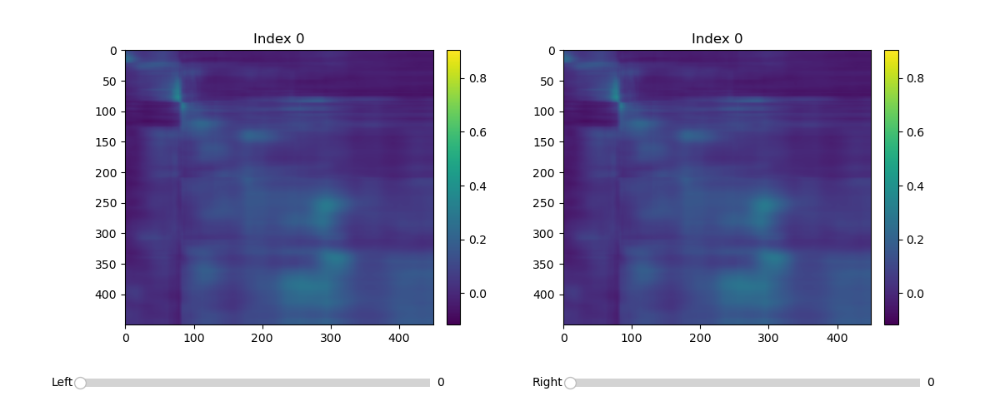

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
 
# --- Example data: (n_slices, n_rows, n_cols) ---
n_slices = 29

trials_input = trials


trial_mats = np.zeros((29, 450, 450))
for i in range(29):
    corr_mats, names = correlate_two_pop_vectors( trials_input[i,:,:],  trials_input[slice(10,30,1)].mean(axis = 0), 'early_pre', 'late_pre')
    trial_mats[i,:,:] = corr_mats[-1]

data = trial_mats
 
# --- Global color limits for consistent comparison ---
vmin, vmax = data.min(), data.max()
 
# --- Figure setup ---
fig, (ax_l, ax_r) = plt.subplots(1, 2, figsize=(12, 5))
fig.subplots_adjust(bottom=0.22, wspace=0.3)
 
im_l = ax_l.imshow(data[0], aspect="auto", vmin=vmin, vmax=vmax, cmap="viridis")
im_r = ax_r.imshow(data[0], aspect="auto", vmin=vmin, vmax=vmax, cmap="viridis")
 
title_l = ax_l.set_title("Index 0")
title_r = ax_r.set_title("Index 0")
 
fig.colorbar(im_l, ax=ax_l, fraction=0.046, pad=0.04)
fig.colorbar(im_r, ax=ax_r, fraction=0.046, pad=0.04)
 
# --- Sliders ---
ax_slider_l = fig.add_axes([0.08, 0.06, 0.35, 0.04])
ax_slider_r = fig.add_axes([0.57, 0.06, 0.35, 0.04])
 
slider_l = Slider(ax_slider_l, "Left", 0, n_slices - 1, valinit=0, valstep=1)
slider_r = Slider(ax_slider_r, "Right", 0, n_slices - 1, valinit=0, valstep=1)
 
 
def update_left(val):
    idx = int(slider_l.val)
    im_l.set_data(data[idx])
    title_l.set_text(f"Index {idx}, omission: {omit[idx]}")
    fig.canvas.draw_idle()
 
 
def update_right(val):
    idx = int(slider_r.val)
    im_r.set_data(data[idx])
    title_r.set_text(f"Index {idx}, omission: {omit[idx]}")
    fig.canvas.draw_idle()
 
 
slider_l.on_changed(update_left)
slider_r.on_changed(update_right)
 
plt.show()

In [42]:
trials_re = trials.reshape((trials.shape[0]*trials.shape[1], trials.shape[2]))
trials_re.shape

(36000, 876)

In [43]:
80*450

36000

In [44]:
def stretch_normalize_across_trials(trials_matrix):
    trials_re = trials_matrix.reshape((trials_matrix.shape[0]*trials_matrix.shape[1], trials_matrix.shape[2]))
    trials_re = (trials_re - trials_re.min(axis = 0))
    trials_re = trials_re/(trials_re.max(axis = 0)- trials_re.min(axis = 0))
    return trials_re.reshape(trials_matrix.shape)

In [45]:
trials_st = stretch_normalize_across_trials(trials)

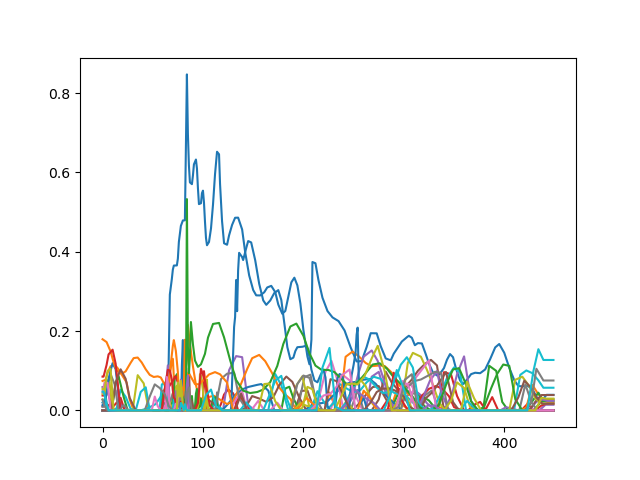

In [46]:
fig, ax = plt.subplots()
for i in range(30):
    ax.plot(trials_st[i, :, 10])

In [47]:
dat_arr = trials_st.reshape(trials_st.shape[0]*trials_st.shape[1], trials_st.shape[-1])

In [48]:
position = np.asarray([i for i in range(450)]*trials_st.shape[0])

In [49]:
import umap

reducer = umap.UMAP(n_neighbors=100)

embedding = reducer.fit_transform(dat_arr)
embedding.shape

2026-05-27 15:01:45.390144: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-27 15:01:45.417046: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


(36000, 2)

In [50]:
r_loc, r_name = behavior.get_reward_zones(sess)
sum(r_name == r_name[0])

array([30])

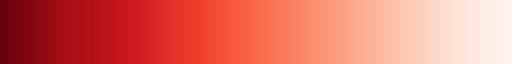

In [51]:
plt.cm.Reds_r

In [52]:
r_loc[0][1] - r_loc[0][0]

50

In [53]:
import seaborn as sns

r_loc, r_name = behavior.get_reward_zones(sess)
r_zone_length = r_loc[0][1]- r_loc[0][0]
r_zone_cmap = plt.cm.Reds_r(np.linspace(0, 1, 2*(r_zone_length)))

position[:30*450].shape
cmap = plt.cm.viridis(np.linspace(0, 1, 450))
cmap2 = cmap.copy()

cmap[r_zones[0][0]:r_zones[0][1],:] = r_zone_cmap[:r_zone_length,:]
color_1 = np.asarray([cmap[x%450] for x in position[:30*450]])
cmap2[r_zones[-1][0]:r_zones[-1][1],:] = r_zone_cmap[:r_zone_length,:]
color_2 = np.asarray([cmap2[x%450] for x in position[30*450:50*450]])

color_3 = np.asarray([cmap2[x%450] for x in position[50*450:]])


Text(0.5, 1.0, 'shift: trials 50 - 80')

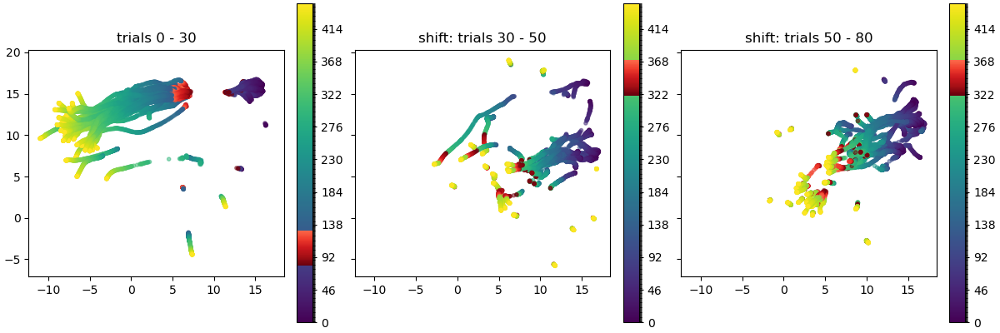

In [54]:
%matplotlib widget
from matplotlib.colors import ListedColormap, BoundaryNorm
fig, axs = plt.subplots(1, 3, figsize=(12, 4), subplot_kw={"aspect": "equal"}, 
                        layout="constrained", sharex = True, sharey = True)

im1 = axs[0].scatter(embedding[:30*450,0], embedding[:30*450,1], alpha = 0.5, marker = '.', c = color_1)
im2 = axs[1].scatter(embedding[30*450:50*450,0], embedding[30*450:50*450,1], alpha = 0.5, marker = '.', c = color_2)
im3 = axs[2].scatter(embedding[50*450:,0], embedding[50*450:,1], alpha = 0.5, marker = '.', c = color_3)


fig.colorbar(plt.cm.ScalarMappable(cmap=ListedColormap(cmap), norm = BoundaryNorm(np.arange(451), 450)), ax = axs[0])
fig.colorbar(plt.cm.ScalarMappable(cmap=ListedColormap(cmap2), norm = BoundaryNorm(np.arange(451), 450)), ax = axs[1])
fig.colorbar(plt.cm.ScalarMappable(cmap=ListedColormap(cmap2), norm = BoundaryNorm(np.arange(451), 450)), ax = axs[2])


axs[0].set_title('trials 0 - 30')
axs[1].set_title('shift: trials 30 - 50')
axs[2].set_title('shift: trials 50 - 80')

In [55]:
import umap.plot
umap.plot.connectivity(reducer, edge_bundling='hammer')

/home/sosalab/miniconda3/envs/umap_env/lib/python3.11/site-packages/numba/np/ufunc/dufunc.py:346: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/home/sosalab/miniconda3/envs/umap_env/lib/python3.11/site-packages/numba/np/ufunc/dufunc.py:346: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/home/sosalab/miniconda3/envs/umap_env/lib/python3.11/site-packages/numba/np/ufunc/dufunc.py:346: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the s

KeyboardInterrupt: 

<Axes: title={'center': 'Colored by RGB coords of PCA embedding'}>

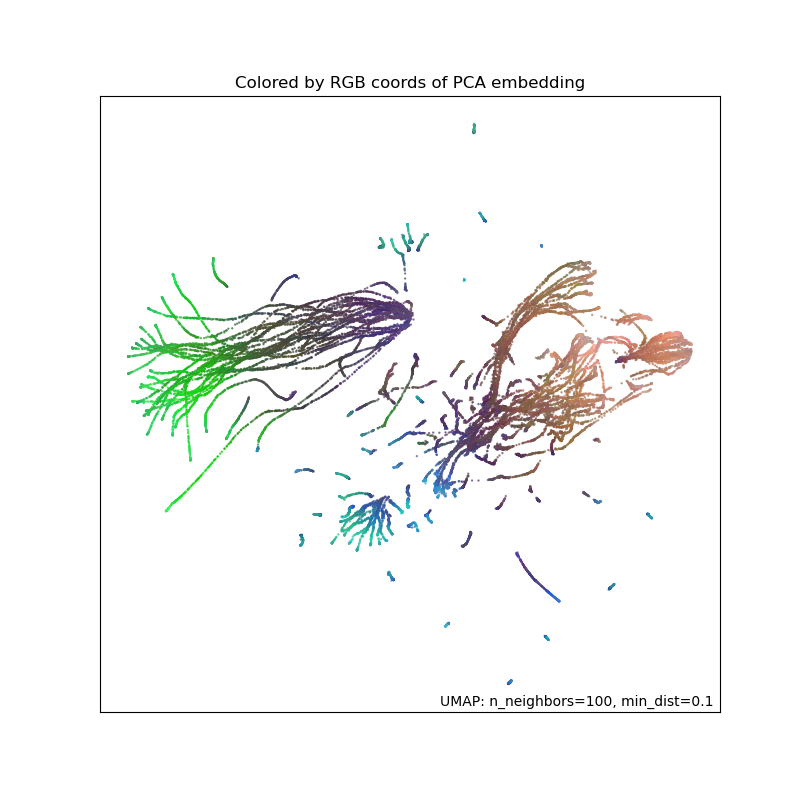

In [ ]:

umap.plot.diagnostic(reducer, diagnostic_type='pca')

In [ ]:
trials

array([[[5.67897735e-03, 3.84523021e-03, 2.77537410e-03, ...,
         0.00000000e+00, 5.68385469e-03, 0.00000000e+00],
        [5.67897735e-03, 3.84523021e-03, 2.77537410e-03, ...,
         0.00000000e+00, 5.68385469e-03, 0.00000000e+00],
        [5.67897735e-03, 3.84523021e-03, 2.77537410e-03, ...,
         0.00000000e+00, 5.68385469e-03, 0.00000000e+00],
        ...,
        [2.08996966e-01, 1.39612854e-01, 4.35044384e-03, ...,
         8.05730969e-02, 8.43275432e-03, 0.00000000e+00],
        [2.08996966e-01, 1.39612854e-01, 4.35044384e-03, ...,
         8.05730969e-02, 8.43275432e-03, 0.00000000e+00],
        [2.08996966e-01, 1.39612854e-01, 4.35044384e-03, ...,
         8.05730969e-02, 8.43275432e-03, 0.00000000e+00]],

       [[3.51977460e-02, 2.64646672e-02, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 5.37639670e-03],
        [3.56197419e-02, 2.55086912e-02, 0.00000000e+00, ...,
         5.05175876e-03, 0.00000000e+00, 6.63066655e-03],
        [3.60417378e-02, 

In [56]:
# Whether to implement a correction for any trials where the lick sensor was faulty
correct_sensor_error= True
correction_thr = 0.3
zscore = False
# Whether to excluding reward zone from anticipatory lick ratio
exclude_reward_zone = True
exclude_consum_licks = False # exclude consummatory licks 2s after the reward is delivered

reward_z_label = multi_anim_sess[example_an]['rz label']
labels = np.unique(reward_z_label)
trials_pre = np.where(reward_z_label == labels[0])[0]
trials_post = np.where(reward_z_label == labels[1])[0]
lickdata_pre = behavior.calc_lick_metrics(sess,
                                    trials_pre,
                                    correct_sensor_error=correct_sensor_error,
                                    correction_thr=correction_thr,
                                    permute_licks=False,
                                    exclude_reward_zone=exclude_reward_zone,
                                    exclude_consum_licks=exclude_consum_licks,
                                    zscore=zscore
                                    )

lickdata_post = behavior.calc_lick_metrics(sess,
                                    trials_post,
                                    correct_sensor_error=correct_sensor_error,
                                    correction_thr=correction_thr,
                                    permute_licks=False,
                                    exclude_reward_zone=exclude_reward_zone,
                                    exclude_consum_licks=exclude_consum_licks,
                                    zscore=zscore
                                    )

/home/sosalab/local_repos/Sosa_et_al_2024/src/reward_relative/behavior.py:948: RuntimeWarning: invalid value encountered in divide
  trial_ant_ratio = (


(array([0.21260504, 0.        , 0.        , 0.10630252, 0.10630252,
        0.42521008, 1.27563025, 1.16932773, 0.85042017, 1.16932773]),
 array([-1.        , -0.81185771, -0.62371542, -0.43557312, -0.24743083,
        -0.05928854,  0.12885375,  0.31699605,  0.50513834,  0.69328063,
         0.88142292]),
 <BarContainer object of 10 artists>)

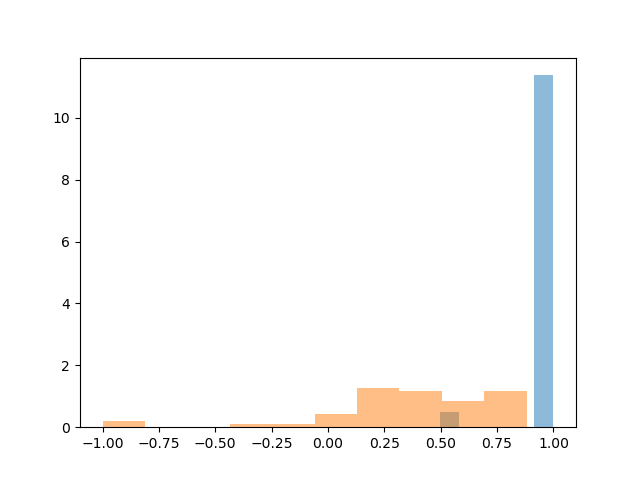

In [89]:
fig, ax = plt.subplots()
ax.hist(lickdata_pre['trial_lick_ratio'], bins = 'auto', density=True, alpha = 0.5)
ax.hist(lickdata_post['trial_lick_ratio'], bins = 'auto',  density=True, alpha = 0.5)

In [58]:
lickdata_pre.keys()

dict_keys(['mean_licks', 'sem_licks', 'lick_mat', 'perm_lick_mat', 'ant_slope', 'trial_lick_ratio', 'perm_trial_lick_ratio'])

In [59]:
sess.vr_data['lick'].values.shape

(18000,)

In [60]:
tm_lick = TwoPUtils.spatial_analyses.trial_matrix(sess.timeseries['licks'].T,
                                                sess.vr_data['pos']._values,
                                                sess.trial_start_inds,
                                                sess.teleport_inds,
                                                bin_size=1,
                                                min_pos=0,
                                                max_pos=450,
                                                speed_thr=2,
                                                speed=sess.vr_data['speed']._values,
                                                impute_nans = True,
                                                
                                                )

In [61]:
# Whether to implement a correction for any trials where the lick sensor was faulty
correct_sensor_error= True
correction_thr = 0.3
zscore = False
# Whether to excluding reward zone from anticipatory lick ratio
exclude_reward_zone = True
exclude_consum_licks = False # exclude consummatory licks 2s after the reward is delivered
if exclude_reward_zone:
        end_ind = 0
else:
    end_ind = 1

if exclude_consum_licks:
    licks = behavior.antic_consum_licks(sess)
else:
    licks = np.copy(sess.vr_data['lick'].values)

pos = np.copy(tm_lick[2][-1])  # bin centers
bin_edges = tm_lick[2]

rawpos = sess.vr_data['pos'].values
tstarts = sess.trial_start_inds
tends = sess.teleport_inds

frame_time = behavior.frametime(sess)

if hasattr(sess, 'change_reward_trial'):
    reward_zone, _ = get_reward_zones(sess, change_trial = sess.change_reward_trial)
else:
    reward_zone, _ = behavior.get_reward_zones(sess)


mean_licks, sem_licks, lickmat = behavior.lickrate_PETH(licks,
                                                rawpos,
                                                bin_edges,
                                                tstarts,
                                                tends,
                                                frame_time=frame_time,
                                                trial_subset=None,
                                                correct_sensor_error=correct_sensor_error,
                                                correction_thr=correction_thr,
                                                zscore=zscore)

/home/sosalab/local_repos/Sosa_et_al_2024/src/reward_relative/behavior.py:838: RuntimeWarning: invalid value encountered in divide
  licks_per_bin[trial, :] = licks_per_bin[trial, :] / \


In [62]:
tm_lick[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

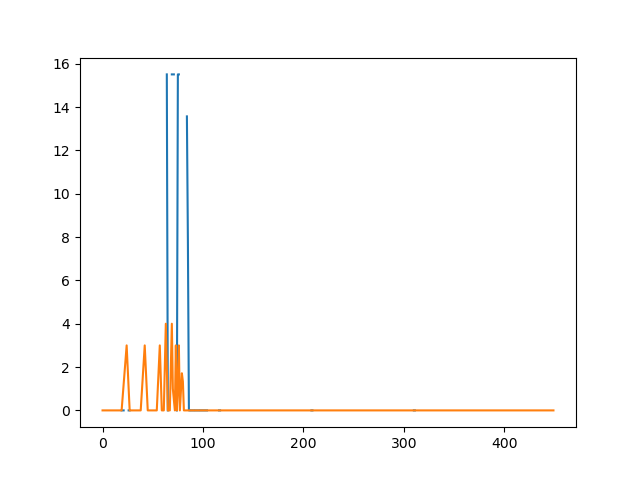

In [63]:
fig, ax = plt.subplots()
ax.plot(lickmat[0])
ax.plot(tm_lick[0][1])

In [78]:
lick_mapper = umap.UMAP().fit(tm_lick[0], n_neighbors = 100)

In [79]:
np.linspace(1, 80, 80)

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51., 52.,
       53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64., 65.,
       66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77., 78.,
       79., 80.])

In [80]:
lick_mapper.embedding_.shape

(80, 2)

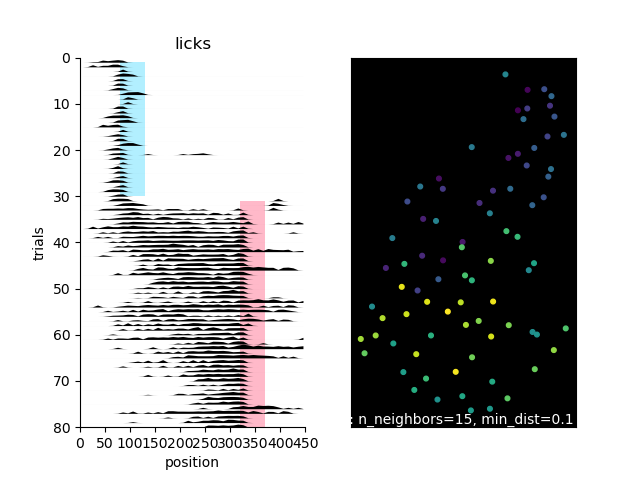

In [81]:
fig, axs = plt.subplots(ncols = 2)
umap.plot.points(lick_mapper,values = np.linspace(1, 80, 80), theme = 'viridis', ax = axs[-1])

_ = behavior.plot_norm_lick_raster(sess, correct_sensor_error = True, ax = axs[0])

[0, 80]


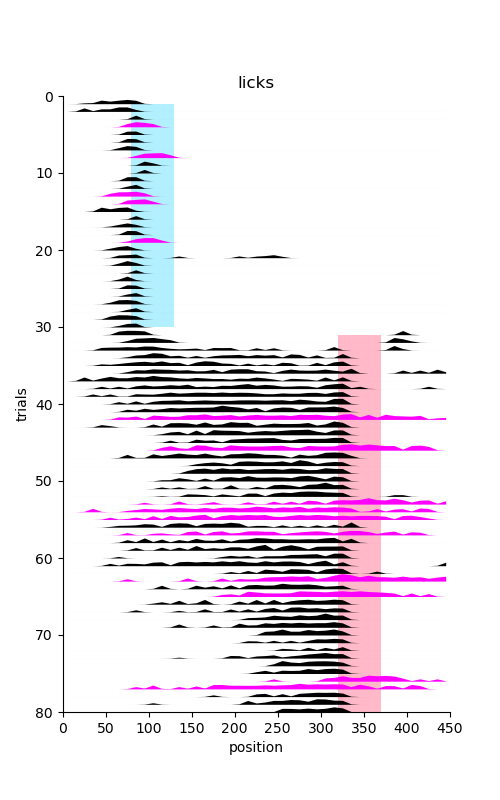

In [88]:
lick_sess = multi_anim_sess['GCAMP14']['sess']
isreward, morph = behavior.get_trial_types(
                    lick_sess)

fig, ax, errors = behavior.plot_norm_lick_raster(lick_sess,
    isreward = isreward,
    # cmap = 'RdGy',
    correct_sensor_error = True)
# fig, ax, errors = behavior.plot_norm_lick_raster(sess, correct_sensor_error = True)

print(errors)

In [ ]:
from reward_relative.path_dict_seahorse import path_dictionary as path_dict

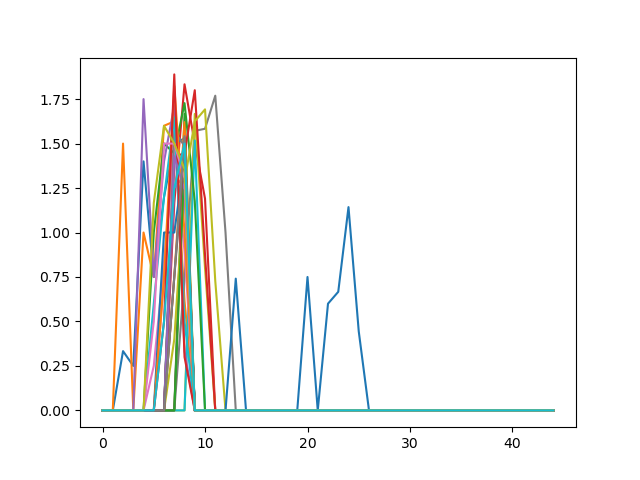

In [ ]:
lick_mat1, lick_mat2, lick_mat3, lick_mat4 = sess.trial_matrices['licks']
plt.figure()
for trial in lick_mat1[:30]:
    _ = plt.plot(trial)

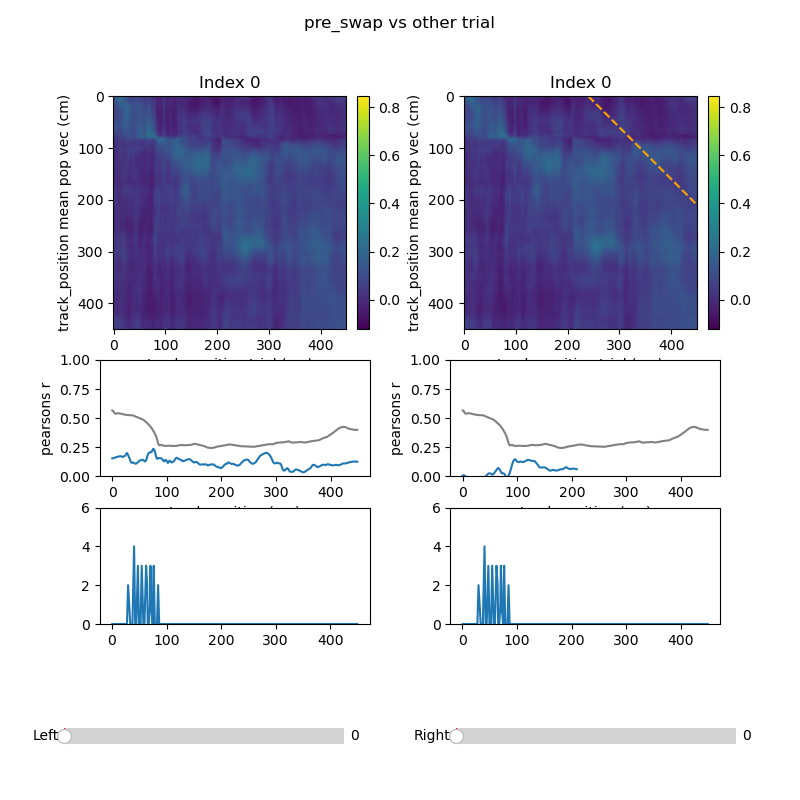

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
 
# --- Example data: (n_slices, n_rows, n_cols) ---
n_slices = 80

trials_input = ndi.gaussian_filter(trials_st,sigma = 1,  axes = 1)

fig = plt.figure(figsize = (8,8))
fig.suptitle('pre_swap vs other trial')
axes_dict = fig.subplot_mosaic([['frame_1', 'frame_2'],
                                    ['diag_1', 'diag_2'],
                                    ['lick_1', 'lick_2']],
                                height_ratios = [2.0,1.0, 1.0],
                                width_ratios = [2.0,2.0,])


trial_mats = np.zeros((80, 450, 450))
for i in range(80):
    corr_mats, names = correlate_two_pop_vectors( trials_input[slice(10,30,1)].mean(axis = 0), trials_input[i,:,:],  'early_pre', 'late_pre')
    trial_mats[i,:,:] = corr_mats[-1]

data = trial_mats
lick_dat = tm_lick[0]
lick_bins = tm_lick[-1]

 
# --- Global color limits for consistent comparison ---
vmin, vmax = data.min(), data.max()
 
# --- Figure setup ---



ax_l, ax_r = axes_dict['frame_1'], axes_dict['frame_2']
ax_d_l, ax_d_r = axes_dict['diag_1'], axes_dict['diag_2']
ax_lick_l, ax_lick_r = axes_dict['lick_1'], axes_dict['lick_2']

fig.subplots_adjust(bottom=0.22, wspace=0.3)
 
im_l = ax_l.imshow(data[0], aspect="auto", vmin=vmin, vmax=vmax, cmap="viridis")
im_r = ax_r.imshow(data[0], aspect="auto", vmin=vmin, vmax=vmax, cmap="viridis")

ax_l.set_aspect(1.0)
ax_r.set_aspect(1.0)

ax_d_l.plot(np.diag(data.mean(axis = 0)), color = 'gray')
ax_d_r.plot(np.diag(data.mean(axis = 0)), color = 'gray')
zone_offset = r_zones[-1][0] - r_zones[0][0]



diag_1 = ax_d_l.plot(np.diag(data[0]))[0]

### plot the diagonal offset by the linear shift in zone position
zone_offset = r_zones[-1][0] - r_zones[0][0]

diag_2 = ax_d_r.plot(np.diagonal(data[0], offset = zone_offset))[0]

lick_1 = ax_lick_l.plot(lick_bins, lick_dat[0])[0]
lick_2 = ax_lick_r.plot(lick_bins, lick_dat[0])[0]

ax_lick_l.set_ylim(0, lick_dat.max())
ax_lick_r.set_ylim(0, lick_dat.max())


ax_d_l.set_ylim((0,1))
ax_d_r.set_ylim((0,1))

ax_d_l.set_ylabel('pearsons r')
ax_d_r.set_ylabel('pearsons r')

ax_d_l.set_xlabel('track position (cm)')
ax_d_r.set_xlabel('track position (cm)')

for ax in [ax_l, ax_r]:
    ax.set_ylabel('track_position mean pop vec (cm)')
    ax.set_xlabel('track_position trial (cm)')
 
title_l = ax_l.set_title("Index 0")
title_r = ax_r.set_title("Index 0")
 
fig.colorbar(im_l, ax=ax_l, fraction=0.046, pad=0.04)
fig.colorbar(im_r, ax=ax_r, fraction=0.046, pad=0.04)
 
# --- Sliders ---
ax_slider_l = fig.add_axes([0.08, 0.06, 0.35, 0.04])
ax_slider_r = fig.add_axes([0.57, 0.06, 0.35, 0.04])
 
slider_l = Slider(ax_slider_l, "Left", 0, n_slices - 1, valinit=0, valstep=1)
slider_r = Slider(ax_slider_r, "Right", 0, n_slices - 1, valinit=0, valstep=1)
 
 
def update_left(val):
    idx = int(slider_l.val)
    im_l.set_data(data[idx])
    diag_1.set_ydata(np.diag(data[idx]))
    lick_1.set_ydata(lick_dat[idx])
    title_l.set_text(f"Index {idx}, omission: {omit[idx]}")
    fig.canvas.draw_idle()
 


def update_right(val):
    idx = int(slider_r.val)
    im_r.set_data(data[idx])
    diag_2.set_ydata(np.diagonal(data[idx], offset = zone_offset))
    lick_2.set_ydata(lick_dat[idx])
    title_r.set_text(f"Index {idx}, omission: {omit[idx]}")
    fig.canvas.draw_idle()
 
ax_r.plot([zone_offset,449], [0, 449-zone_offset], color = 'orange', linestyle = '--')
slider_l.on_changed(update_left)
slider_r.on_changed(update_right)
 
plt.show()

In [ ]:
lick

0

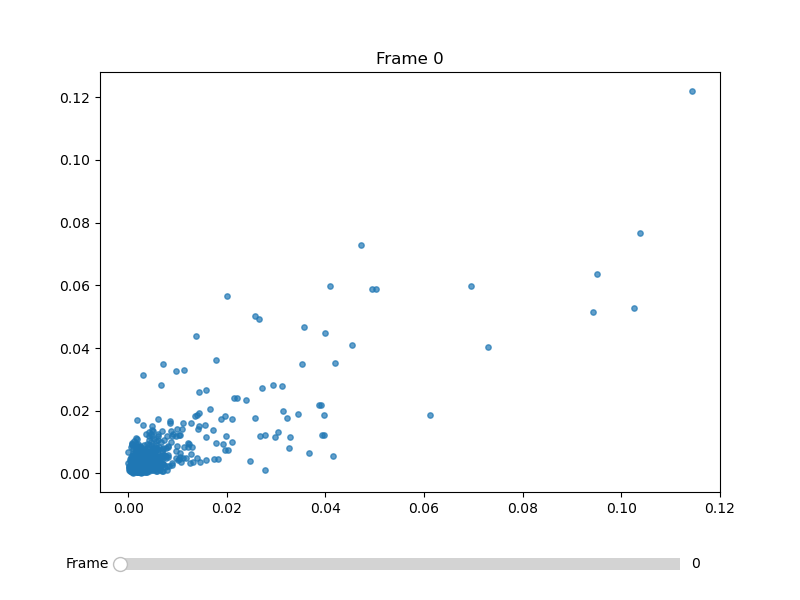

In [ ]:
from scipy.spatial.distance import cosine




import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

n_frames = 450

# x_data[i] and y_data[i] are the (x, y) coords for frame i
x_data = trials[pre].mean(axis = 0)
y_data = trials[post].mean(axis = 0)

# --- Figure setup ---
fig, ax = plt.subplots(figsize=(8, 6))
fig.subplots_adjust(bottom=0.18)

scatter = ax.scatter(x_data[0], y_data[0], s=15, alpha=0.7)

title = ax.set_title("Frame 0")

# --- Slider ---
ax_slider = fig.add_axes([0.15, 0.04, 0.7, 0.04])
slider = Slider(
    ax_slider,
    "Frame",
    valmin=0,
    valmax=n_frames - 1,
    valinit=0,
    valstep=1,
)


def update(val):
    idx = int(slider.val)
    scatter.set_offsets(np.column_stack([x_data[idx], y_data[idx]]))
    # similarity = 1 - cosine_distance
    sim = 1 - cosine(x_data[idx], y_data[idx])
    title.set_text(f"track position {idx} cm, pearsons {np.round(np.corrcoef(x_data[idx], y_data[idx])[0,1], 3)} | cosine sim: {np.round(sim, 3)}")
    fig.canvas.draw_idle()


slider.on_changed(update)

In [ ]:
def vector_angle(u, v):
    dot_product = np.dot(u, v)
    magnitude_u = np.linalg.norm(u)
    magnitude_v = np.linalg.norm(v)
    angle = np.degrees(np.arccos(dot_product / (magnitude_u * magnitude_v)))
    return angle

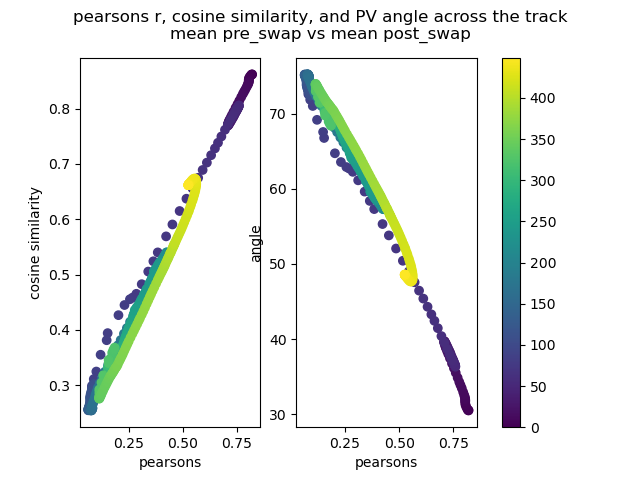

In [ ]:
pears_vs_cos = np.zeros((450,3))
for idx in range(450):
    v1, v2 = trials[pre].mean(axis = 0)[idx], trials[post].mean(axis = 0)[idx]
    sim = 1 - cosine(v1, v2)
    pears =np.corrcoef(v1, v2)[0,1]
    angle = vector_angle(v1, v2)
    pears_vs_cos[idx, :] = [pears, sim, angle]

fig, axs =plt.subplots(ncols = 2)
scat = axs[0].scatter(pears_vs_cos[:,0], pears_vs_cos[:,1], c = [i for i in range(450)], cmap = 'viridis')
axs[1].scatter(pears_vs_cos[:,0], pears_vs_cos[:,2],c = [i for i in range(450)], cmap = 'viridis')

axs[0].set_xlabel('pearsons')
axs[0].set_ylabel('cosine similarity')

axs[1].set_xlabel('pearsons')
axs[1].set_ylabel('angle')

fig.suptitle('pearsons r, cosine similarity, and PV angle across the track\nmean pre_swap vs mean post_swap')
fig.colorbar(scat, ax = axs)

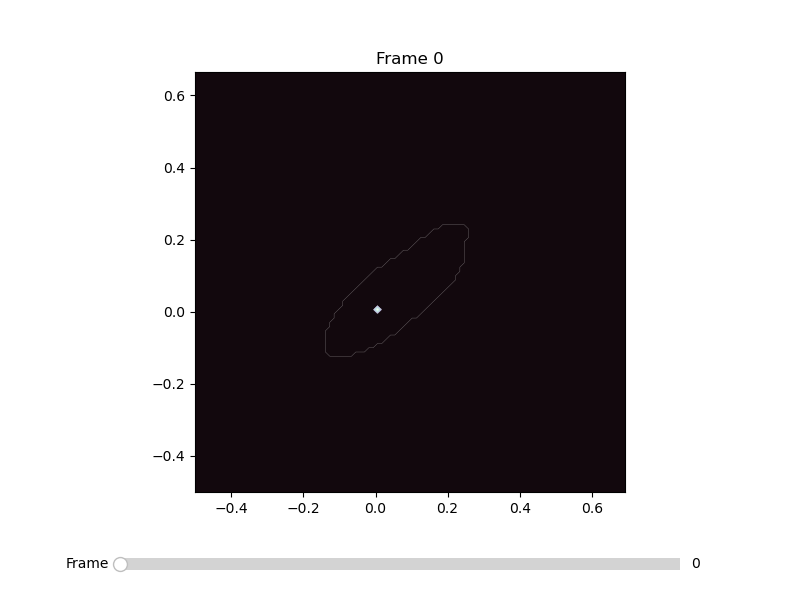

In [ ]:
from scipy.stats import gaussian_kde

# --- Fixed grid ---
pad = 0.5
x_min, x_max = x_data.min() - pad, x_data.max() + pad
y_min, y_max = y_data.min() - pad, y_data.max() + pad
 
grid_res = 100
xi = np.linspace(x_min, x_max, grid_res)
yi = np.linspace(y_min, y_max, grid_res)
Xi, Yi = np.meshgrid(xi, yi)
grid_coords = np.vstack([Xi.ravel(), Yi.ravel()])
 
n_levels = 20  # number of filled contour levels
 
 
def compute_kde(frame_idx):
    xy = np.vstack([x_data[frame_idx], y_data[frame_idx]])
    kde = gaussian_kde(xy)
    Z = kde(grid_coords).reshape(grid_res, grid_res)
    return Z
 
 
# --- Precompute global density range for consistent contour levels ---
# Sample a few frames to estimate
sample_frames = np.linspace(0, n_frames - 1, min(40, n_frames), dtype=int)
global_max = max(compute_kde(i).max() for i in sample_frames)
levels = np.linspace(0, global_max, n_levels + 1)
 
# --- Figure setup ---
fig, ax = plt.subplots(figsize=(8, 6))
fig.subplots_adjust(bottom=0.18)
 
Z0 = compute_kde(0)
contourf = ax.contourf(Xi, Yi, Z0, levels=levels, cmap="mako", extend="max")
contour = ax.contour(
    Xi, Yi, Z0, levels=levels, colors="white", linewidths=0.3, alpha=0.4
)
title = ax.set_title("Frame 0")
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_aspect("equal")
 
# --- Slider ---
ax_slider = fig.add_axes([0.15, 0.04, 0.7, 0.04])
slider = Slider(
    ax_slider,
    "Frame",
    valmin=0,
    valmax=n_frames - 1,
    valinit=0,
    valstep=1,
)
 
 
def update(val):
    idx = int(slider.val)
    Z = compute_kde(idx)
 
    # contourf/contour can't be updated in place — remove and redraw
    for coll in ax.collections[:]:
        coll.remove()
    ax.contourf(Xi, Yi, Z, levels=levels, cmap="mako", extend="max")
    ax.contour(Xi, Yi, Z, levels=levels, colors="white", linewidths=0.3, alpha=0.4)
 
    title.set_text(f"Frame {idx}")
    fig.canvas.draw_idle()
 
 
slider.on_changed(update)
 
plt.show()